# EE551 Embedded Image Processing
## Segmentation - Notebook 1
## Ref. "Image Processing with Python", Sandipan Dey, Packt, 2018


### Import packages

In [125]:
import numpy as np
from skimage.transform import (hough_line, hough_line_peaks, hough_circle, hough_circle_peaks)
from skimage.draw import circle_perimeter
from skimage.feature import canny
from skimage.data import astronaut
from skimage.io import imread, imsave
from skimage.color import rgb2gray, rgba2rgb, gray2rgb, label2rgb
from skimage import img_as_float
from skimage.morphology import skeletonize
from skimage import data, img_as_float
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.filters import sobel, threshold_otsu
from skimage.feature import canny
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries, find_boundaries
from PIL import Image

### Thresholding and Otsu's segmentation

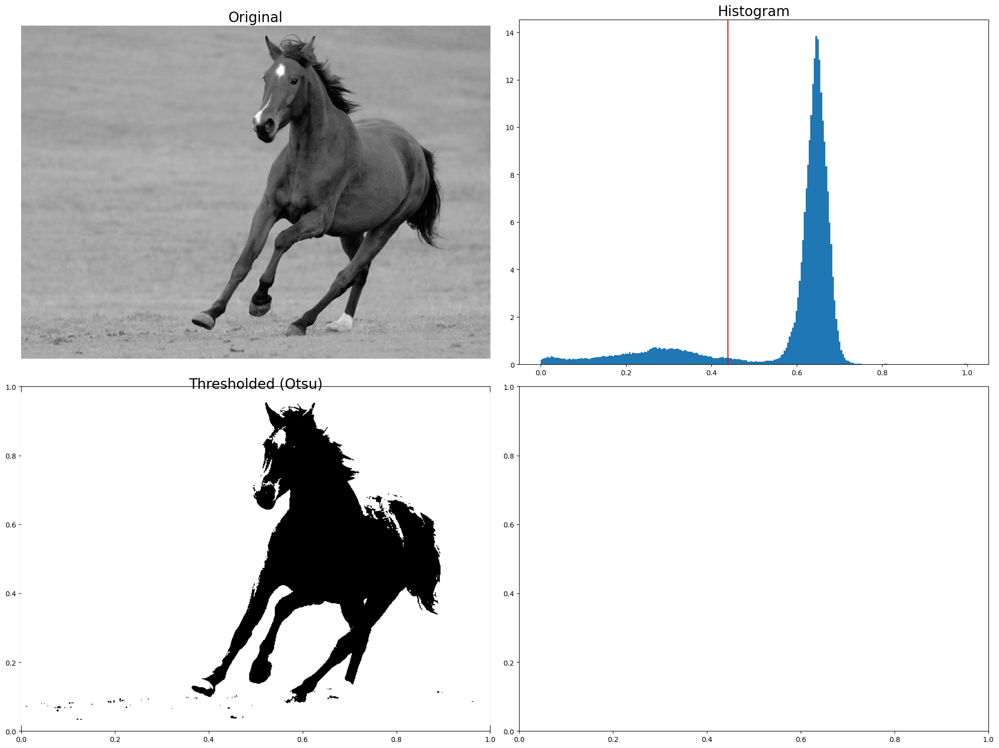

In [127]:
image =  rgb2gray(imread('../../images/horse.jpg')) #data.camera()
thresh = threshold_otsu(image)
binary = image > thresh

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 15))
ax = axes.ravel()
ax[0] = plt.subplot(2, 2, 1)
ax[1] = plt.subplot(2, 2, 2)
ax[2] = plt.subplot(2, 2, 3, sharex=ax[0], sharey=ax[0])
ax[3] = plt.subplot(2, 2, 4, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Original', size=20)
ax[0].axis('off')

ax[1].hist(image.ravel(), bins=256, density=True, stacked=True)
ax[1].set_title('Histogram', size=20)
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded (Otsu)', size=20)
ax[2].axis('off')

ax[3].axis('off')

plt.tight_layout()
plt.show()

### Hough transform – detecting lines and circles

C:\Users\0003031s\AppData\Local\Temp\ipykernel_41540\1896021189.py:24: RuntimeWarning: divide by zero encountered in scalar divide
  y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
C:\Users\0003031s\AppData\Local\Temp\ipykernel_41540\1896021189.py:25: RuntimeWarning: divide by zero encountered in scalar divide
  y1 = (dist - image.shape[1] * np.cos(angle)) / np.sin(angle)


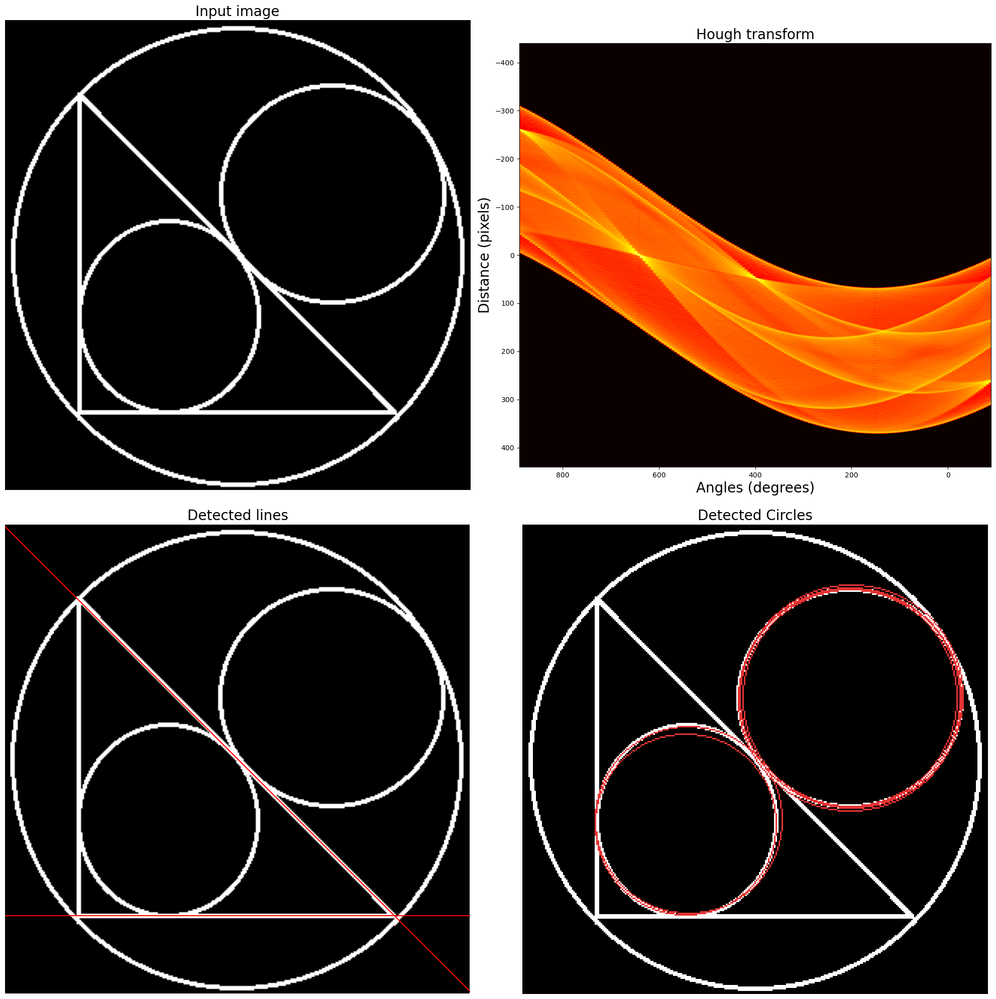

In [129]:
image = rgb2gray(rgba2rgb(imread('../../images/triangle_circle.png')))

# Classic straight-line Hough transform
h, theta, d = hough_line(image)

# Generating figure 1
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
ax = axes.ravel()

ax[0].imshow(image, cmap=cm.gray)
ax[0].set_title('Input image', size=20)
ax[0].set_axis_off()

ax[1].imshow(np.log(1 + h),
             extent=[10*np.rad2deg(theta[-1]), np.rad2deg(theta[0]), d[-1], d[0]],
             cmap=cm.hot, aspect=1/1.5)
ax[1].set_title('Hough transform', size=20)
ax[1].set_xlabel('Angles (degrees)', size=20)
ax[1].set_ylabel('Distance (pixels)', size=20)
ax[1].axis('image')

ax[2].imshow(image, cmap=cm.gray)
for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
    y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
    y1 = (dist - image.shape[1] * np.cos(angle)) / np.sin(angle)
    ax[2].plot((0, image.shape[1]), (y0, y1), '-r')
ax[2].set_xlim((0, image.shape[1]))
ax[2].set_ylim((image.shape[0], 0))
ax[2].set_axis_off()
ax[2].set_title('Detected lines', size=20)

hough_radii = np.arange(50, 100, 2)
hough_res = hough_circle(image, hough_radii)

# Select the most prominent 5 circles
accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii, total_num_peaks=6)

image = gray2rgb(image)
for center_y, center_x, radius in zip(cy, cx, radii):
    circy, circx = circle_perimeter(center_y, center_x, radius)
    image[circy, circx] = (0.9, 0.2, 0.2)

ax[3].imshow(image, cmap=plt.cm.gray)
ax[3].set_axis_off()
ax[3].set_title('Detected Circles', size=20)

plt.tight_layout()
plt.show()


### Felzenszwalb's efficient graph-based image segmentation

In [164]:
from skimage.data import astronaut
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries, find_boundaries
from skimage.util import img_as_float

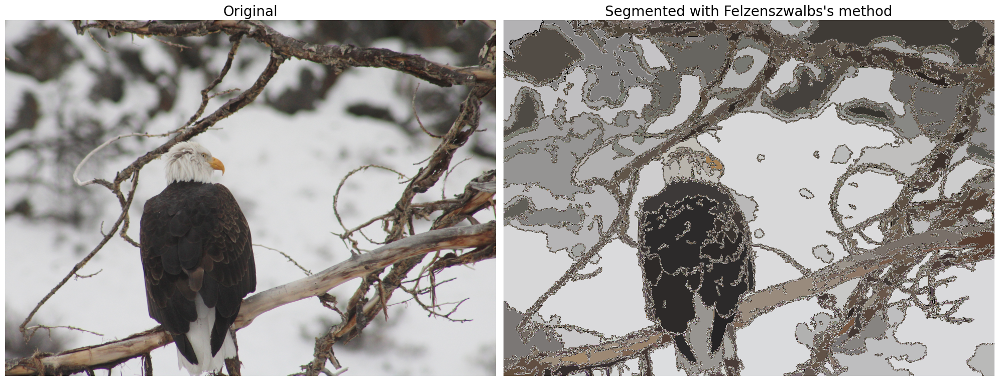

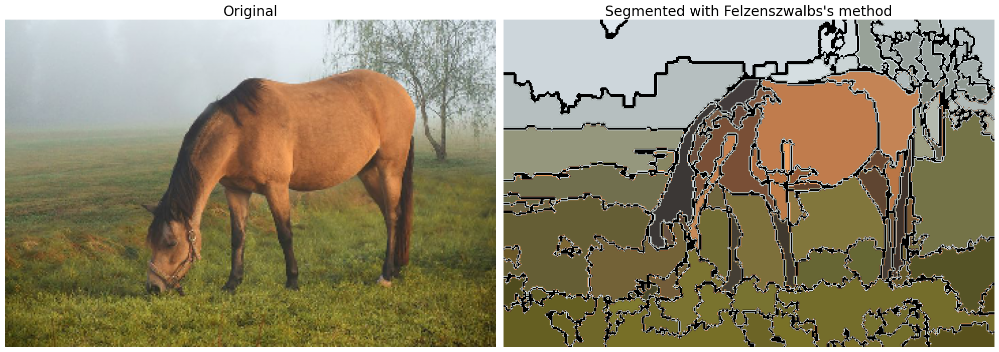

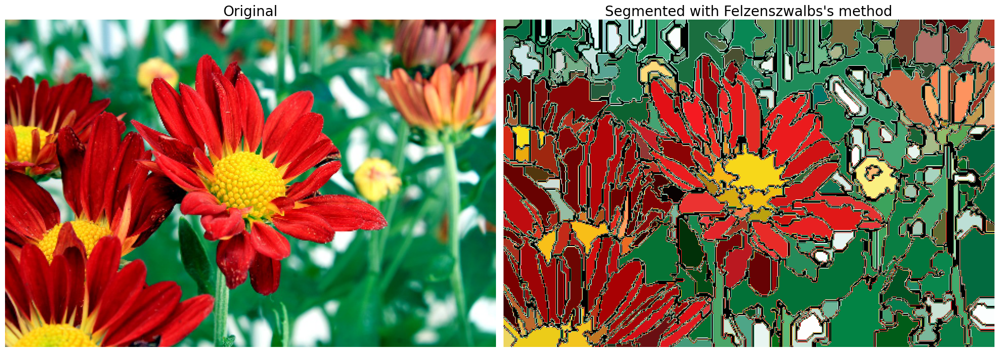

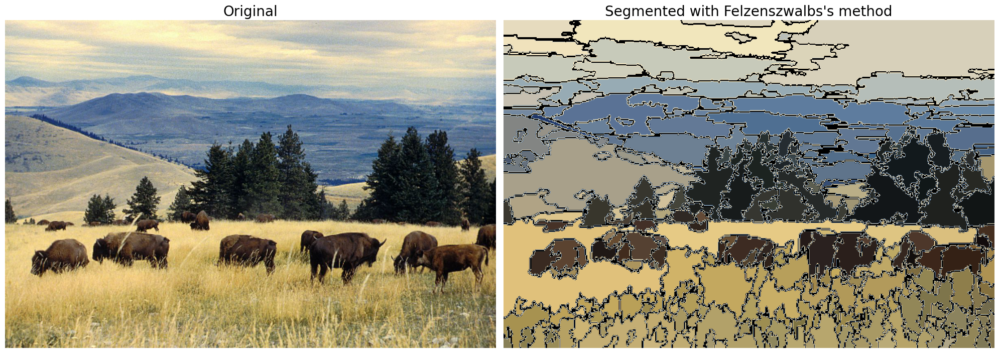

In [166]:
from matplotlib.colors import LinearSegmentedColormap
for imfile in ['../../images/eagle.jpg', '../../images/horses.jpg', '../../images/flowers 1.jpg', '../../images/bisons.jpg']:
    img = img_as_float(imread(imfile)[::2, ::2, :3])
    plt.figure(figsize=(20,10))
    segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=100) #300
    borders = find_boundaries(segments_fz)
    unique_colors = np.unique(segments_fz.ravel())
    segments_fz[borders] = -1 #len(unique_colors)
    colors = [np.zeros(3)]
    for color in unique_colors:
        colors.append(np.mean(img[segments_fz == color], axis=0))    
    cm = LinearSegmentedColormap.from_list('pallete', colors, N=len(colors))
    plt.subplot(121)
    plt.imshow(img)
    plt.title('Original', size=20)
    plt.axis('off') 
    plt.subplot(122)
    plt.imshow(segments_fz, cmap=cm)
    plt.title('Segmented with Felzenszwalbs\'s method', size=20)
    plt.axis('off')   
    plt.tight_layout()
    plt.show()

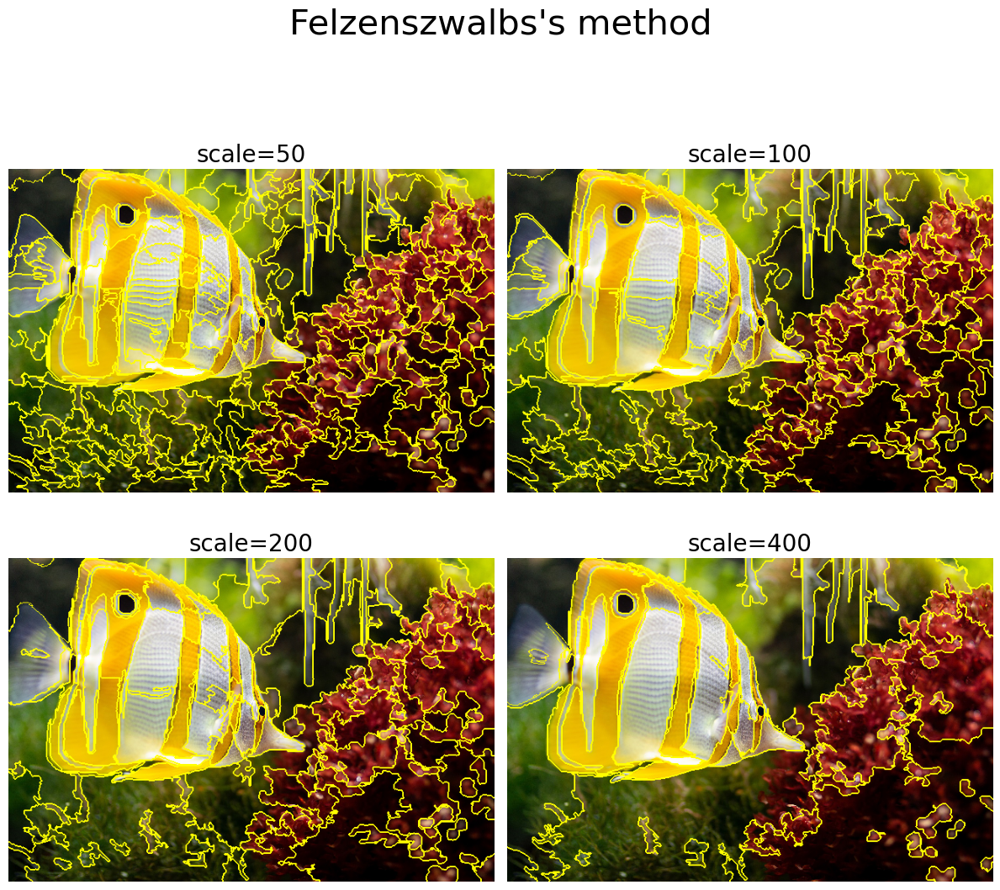

In [170]:
def plot_image(img, title):
    plt.imshow(img)
    plt.title(title, size=20)
    plt.axis('off')    
    
img = imread('../../images/fish.jpg')[::2, ::2, :3] #img_as_float(astronaut()[::2, ::2])

plt.figure(figsize=(12,12))
i = 1
for scale in [50, 100, 200, 400]:
    plt.subplot(2,2,i)
    segments_fz = felzenszwalb(img, scale=scale, sigma=0.5, min_size=200)
    plot_image(mark_boundaries(img, segments_fz), 'scale=' + str(scale))
    i += 1
plt.suptitle('Felzenszwalbs\'s method', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Segmentation with SLIC (Simple Linear Iterative Clustering)

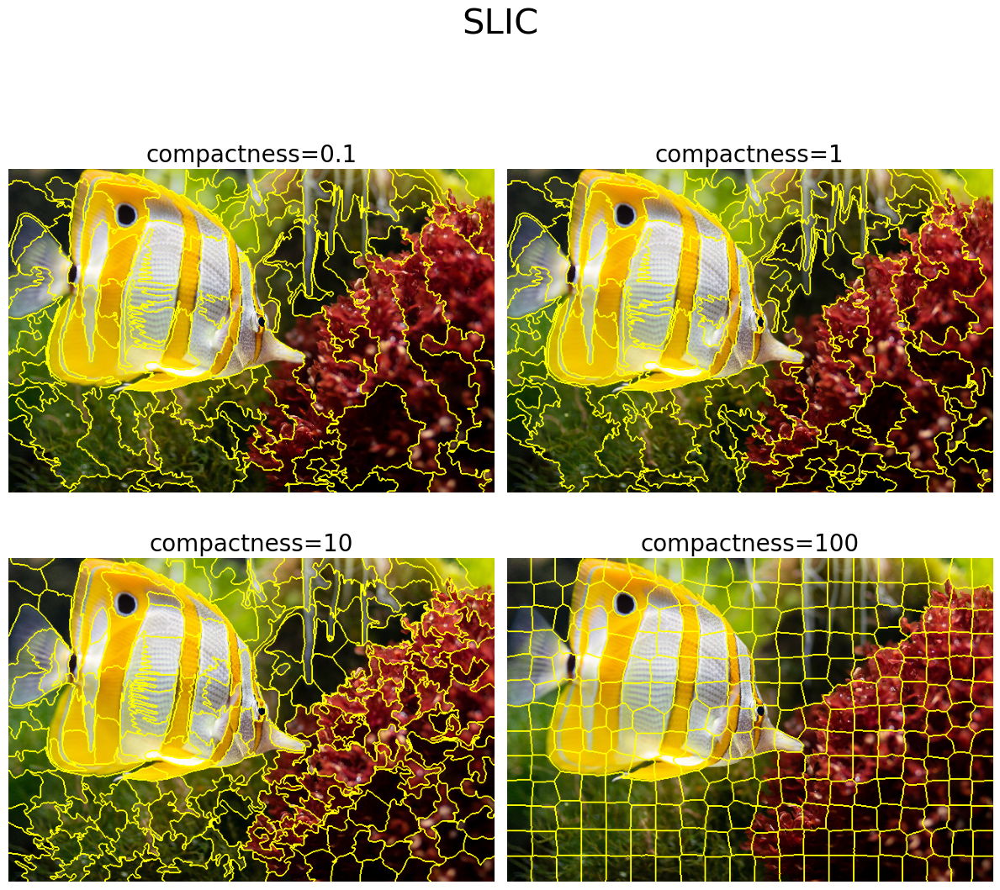

In [153]:
plt.figure(figsize=(12,12))
i = 1
for compactness in [0.1, 1, 10, 100]:
    plt.subplot(2,2,i)
    segments_slic = slic(img, n_segments=250, compactness=compactness, sigma=1)
    plot_image(mark_boundaries(img, segments_slic), 'compactness=' + str(compactness))
    i += 1
plt.suptitle('SLIC', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Segmentation with QuickShift

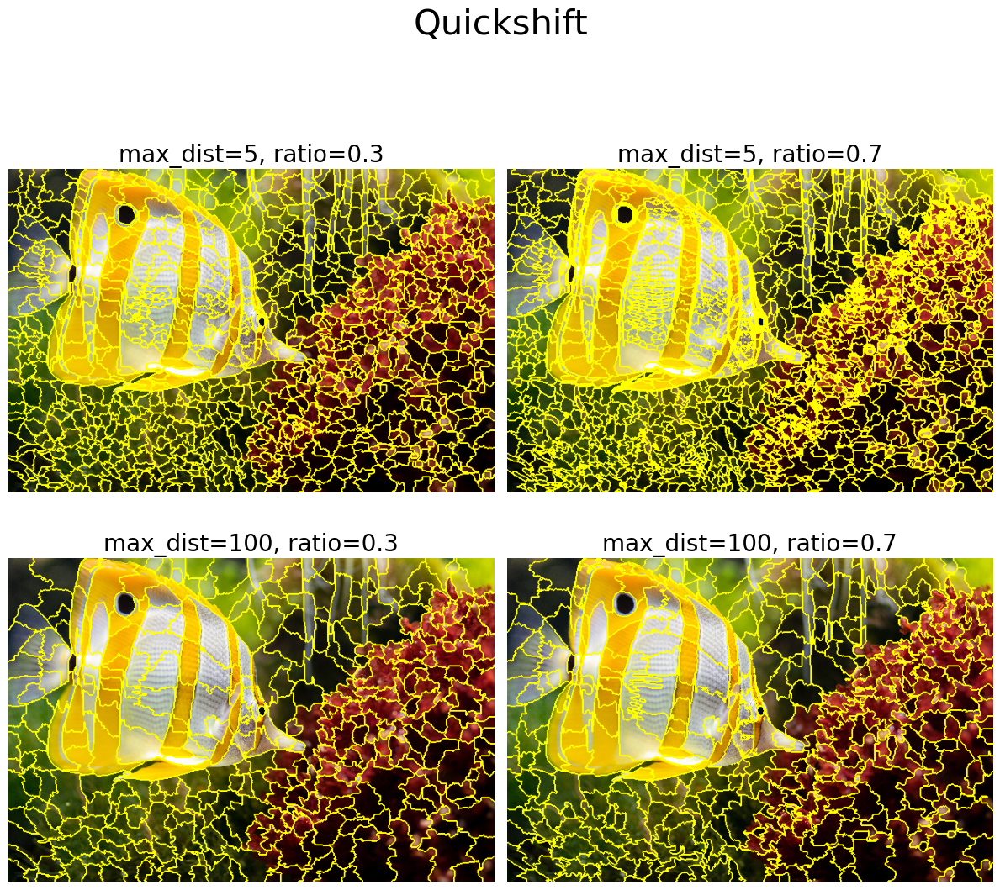

In [143]:
plt.figure(figsize=(12,12))
i = 1
for max_dist in [5, 100]:
    for ratio in [0.3, 0.7]:
        plt.subplot(2,2,i)
        segments_quick = quickshift(img, kernel_size=3, max_dist=max_dist, ratio=ratio)
        plot_image(mark_boundaries(img, segments_quick), 'max_dist=' + str(max_dist) + ', ratio=' + str(ratio))
        i += 1
plt.suptitle('Quickshift', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Segmentation with Watershed

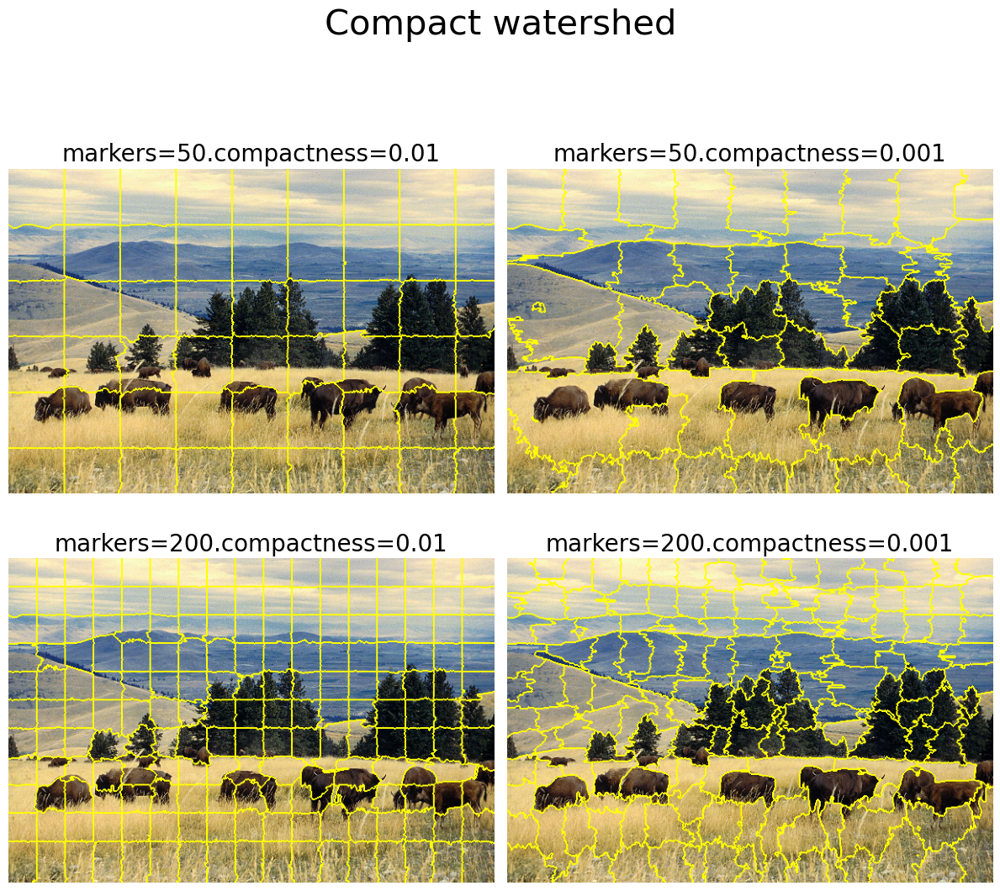

In [168]:
gradient = sobel(rgb2gray(img))
plt.figure(figsize=(12,12))
i = 1
for markers in [50, 200]:
    for compactness in [0.01, 0.001]:
        plt.subplot(2,2,i)
        segments_watershed = watershed(gradient, markers=markers, compactness=compactness)
        plot_image(mark_boundaries(img, segments_watershed), 'markers=' + str(markers) + '.compactness=' + str(compactness))
        i += 1
plt.suptitle('Compact watershed', size=30)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Active contours

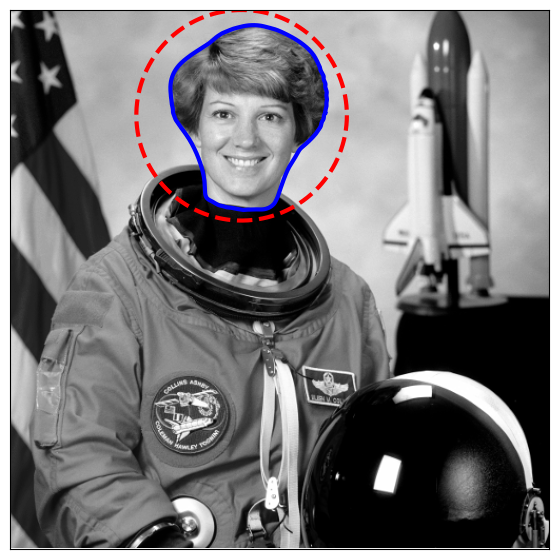

In [172]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage import data
from skimage.filters import gaussian
from skimage.segmentation import active_contour


img = data.astronaut()
img = rgb2gray(img)

s = np.linspace(0, 2*np.pi, 400)
r = 100 + 100*np.sin(s)
c = 220 + 100*np.cos(s)
init = np.array([r, c]).T

snake = active_contour(gaussian(img, 3, preserve_range=False),
                       init, alpha=0.015, beta=10, gamma=0.001)

fig, ax = plt.subplots(figsize=(7, 7))
ax.imshow(img, cmap=plt.cm.gray)
ax.plot(init[:, 1], init[:, 0], '--r', lw=3)
ax.plot(snake[:, 1], snake[:, 0], '-b', lw=3)
ax.set_xticks([]), ax.set_yticks([])
ax.axis([0, img.shape[1], img.shape[0], 0])

plt.show()

### Morphological snakes

In [ ]:
from skimage.segmentation import (morphological_chan_vese, morphological_geodesic_active_contour,
                                  inverse_gaussian_gradient, checkerboard_level_set)

def store_evolution_in(lst):
    """Returns a callback function to store the evolution of the level sets in
    the given list.
    """

    def _store(x):
        lst.append(np.copy(x))
       
    return _store

# Morphological ACWE
image = imread('../images/monalisa.jpg')
image_gray = rgb2gray(image)
# initial level set
init_lvl_set = checkerboard_level_set(image_gray.shape, 6)
# list with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
lvl_set = morphological_chan_vese(image_gray, 30, init_level_set=init_lvl_set, smoothing=3, iter_callback=callback)

fig, axes = plt.subplots(2, 2, figsize=(20, 20))
axes = axes.flatten()
axes[0].imshow(image, cmap="gray"), axes[0].set_axis_off(),
axes[0].contour(lvl_set, [0.5], colors='r')
axes[0].set_title("Morphological ACWE segmentation", fontsize=12)
axes[1].imshow(lvl_set, cmap="gray"), axes[1].set_axis_off()
contour = axes[1].contour(evolution[5], [0.5], colors='g')
contour.collections[0].set_label("Iteration 5")
contour = axes[1].contour(evolution[10], [0.5], colors='y')
contour.collections[0].set_label("Iteration 10")
contour = axes[1].contour(evolution[-1], [0.5], colors='r')
contour.collections[0].set_label("Iteration " + str(len(evolution)-1))
axes[1].legend(loc="upper right"), axes[1].set_title("Morphological ACWE evolution", fontsize=12)
                                                     
# Morphological GAC
image = imread('../images/fishes4.jpg')
image_gray = rgb2gray(image)
gimage = inverse_gaussian_gradient(image_gray)
# initial level set
init_lvl_set = np.zeros(image_gray.shape, dtype=np.int8)
init_lvl_set[10:-10, 10:-10] = 1
# list with intermediate results for plotting the evolution
evolution = []
callback = store_evolution_in(evolution)
lvl_set = morphological_geodesic_active_contour(gimage, 400, init_lvl_set, smoothing=1, balloon=-1, threshold=0.7, iter_callback=callback)
axes[2].imshow(image, cmap="gray"), axes[2].set_axis_off(),
axes[2].contour(lvl_set, [0.5], colors='r')
axes[2].set_title("Morphological GAC segmentation", fontsize=12)
axes[3].imshow(lvl_set, cmap="gray"), axes[3].set_axis_off()
contour = axes[3].contour(evolution[100], [0.5], colors='g')
contour.collections[0].set_label("Iteration 100")
contour = axes[3].contour(evolution[200], [0.5], colors='y')
contour.collections[0].set_label("Iteration 200")
contour = axes[3].contour(evolution[-1], [0.5], colors='r')
contour.collections[0].set_label("Iteration " + str(len(evolution)-1))
axes[3].legend(loc="upper right"), axes[3].set_title("Morphological GAC evolution", fontsize=12)
fig.tight_layout(), plt.show()

### Edges-based/region-based segmentation

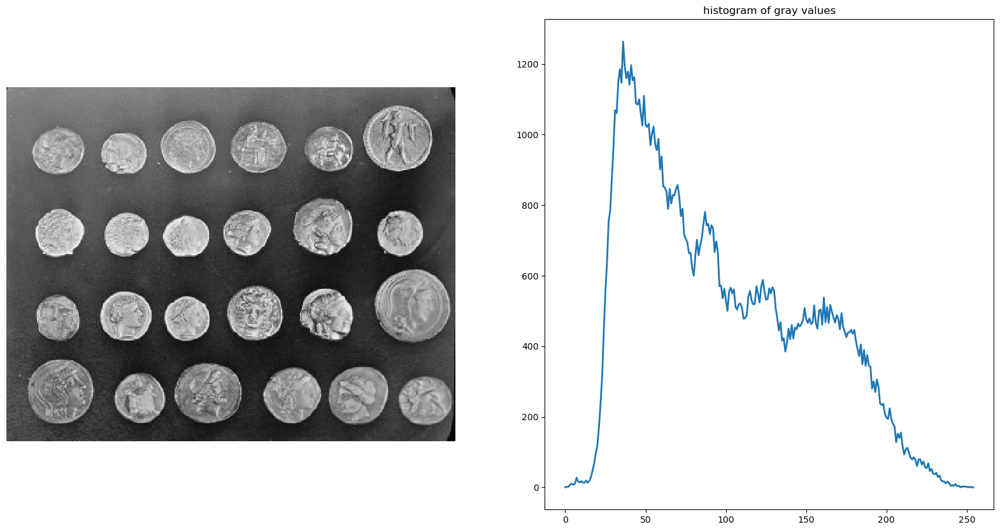

In [156]:
coins = data.coins()
#print(np.max(coins), np.min(coins), np.mean(coins))
hist = np.histogram(coins, bins=np.arange(0, 256))#, normed=True)
#print(hist)

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(coins, cmap=plt.cm.gray, interpolation='nearest')
axes[0].axis('off')
axes[1].plot(hist[1][:-1], hist[0], lw=2)
axes[1].set_title('histogram of gray values')
plt.show()

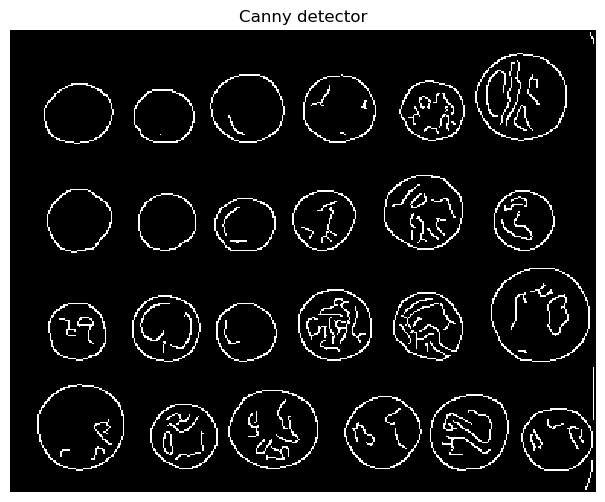

In [158]:
edges = canny(coins, sigma=2)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(edges, cmap=plt.cm.gray, interpolation='nearest')
ax.set_title('Canny detector')
ax.axis('off')
plt.show()

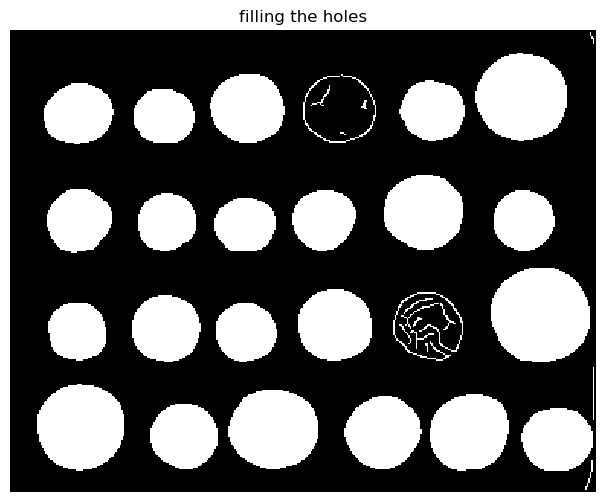

In [160]:
from scipy import ndimage as ndi

fill_coins = ndi.binary_fill_holes(edges)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(fill_coins, cmap=plt.cm.gray, interpolation='nearest')
ax.set_title('filling the holes')
ax.axis('off')
plt.show()

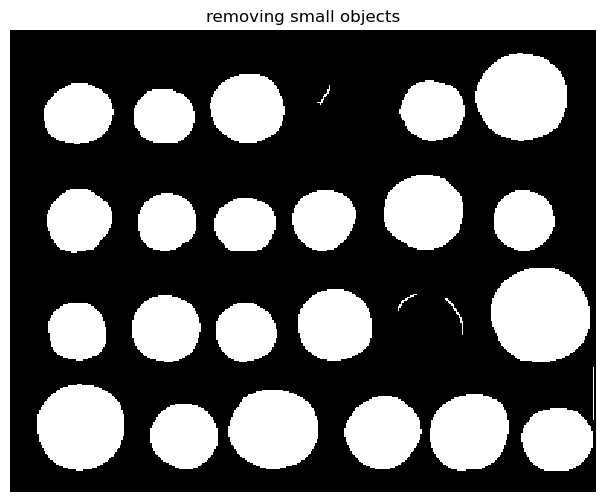

In [162]:
from skimage import morphology

coins_cleaned = morphology.remove_small_objects(fill_coins, 21)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(coins_cleaned, cmap=plt.cm.gray, interpolation='nearest')
ax.set_title('removing small objects')
ax.axis('off')
plt.show()